In [546]:
import pandas as pd
import json 
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import seaborn as sns
from random import randint

In [591]:
#palette = ["#1f77b4","#ff7f0e","#2ca02c","#d62728","#9467bd","#8c564b","#e377c2","#7f7f7f","#bcbd22","#17becf"]
palette = ["#2ca02c","#9467bd","#ff7f0e","#1f77b4","#8c564b", "#d62728", 
            "#e377c2", "#7f7f7f", "#bcbd22", "#17becf"]
            
def formatData(inPath, withComponents=False): 
    with open(inPath, "r") as file: 
        data = json.load(file)

    nodeDf = pd.DataFrame(data["nodes"])
    attrNames = ["label", "x", "y", "size", "color", "category1", "transTitleTopic", "transTitleBusiness", "transTitleSports", "transTitleNews", "hasRJTopic", "maxRJTopic", "gfMention", "raceMention", "blackMention", "protestMention"]
    
    if withComponents == True: 
        attrNames += ["componentNumber"]
        
    #get the attributes as their own dataframe 
    attrKeys = list(nodeDf["attributes"].iloc[0].keys())
    attrDf = pd.DataFrame(list(nodeDf["attributes"]))
    attrDf.columns = attrNames
    nodeDf = pd.concat([nodeDf.drop(columns=["attributes"]), attrDf], axis=1)

    edgeDf = pd.DataFrame(data["edges"]) 
    edgeAttrDf = pd.DataFrame(list(edgeDf["attributes"]))
    edgeDf = pd.concat([edgeDf.drop(columns=["attributes"]), edgeAttrDf], axis=1)

    #get the coordinates we want!
    print(f"before merging shape: {edgeDf.shape}")
    edgeDf = pd.merge(edgeDf, nodeDf[["label", "x", "y"]], left_on="target", right_on="label", how="inner").rename(columns={"x":"target_x", "y":"target_y"})
    edgeDf = pd.merge(edgeDf, nodeDf[["label", "x", "y"]], left_on="source", right_on="label", how="inner").rename(columns={"x":"source_x", "y":"source_y"})
    edgeDf = edgeDf.drop(columns=["label_x", "label_y"])

    edgeDf = pd.merge(edgeDf, nodeDf[["label", "category1"]], left_on="target", right_on="label", how="inner").rename(columns={"category1":"target_category"})
    edgeDf = pd.merge(edgeDf, nodeDf[["label", "category1"]], left_on="source", right_on="label", how="inner").rename(columns={"category1":"source_category", "label_x":"label"}).drop(columns=["label_y"])
    
    print(f"after merging shape: {edgeDf.shape}")
    
    edgeTups = edgeDf[["target_x", "target_y", "source_x", "source_y"]].values.tolist()
    edgeTups = [[(edges[2], edges[3]),(edges[0], edges[1])] for edges in edgeTups]
    
    def getEdgeCat(inRow):

        if inRow["target_category"] == inRow["source_category"]: 
            return inRow["source_category"]
        else: 
            randIndex = randint(0, 1)
            return inRow.iloc[randIndex]

    edgeCats = edgeDf[["target_category", "source_category"]].apply(getEdgeCat, axis=1)

    #map categories to colors
    #get unique categories 
    topCats = ["business", "sports", "news", "society", "health", "religion", "education"]
    uniqueCats = list(nodeDf["category1"].unique())
    topCatsPalette = palette[:7] + ["#edebe4"]*(len(uniqueCats)-len(topCats))

    for cat in topCats: 
        uniqueCats.remove(cat)

    uniqueCats = topCats + uniqueCats

    catMapping = dict(zip(uniqueCats, topCatsPalette))

    #return a bunch of things for creating the graph 
    return nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, list(nodeDf["size"]), topCats


In [548]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/yifanHu_Dist100.json"
with open(LAYOUT_PATH, "r") as file: 
    data = json.load(file)

nodeDf = pd.DataFrame(data["nodes"])

attrNames = ["label", "x", "y", "size", "color", "category1", "transTitleTopic", "transTitleBusiness", "transTitleSports", "transTitleNews", "hasRJTopic", "maxRJTopic", "gfMention", "gfMentions", "raceMention", "blackMention", "protestMention"]
#get the attributes as their own dataframe 
attrKeys = list(nodeDf["attributes"].iloc[0].keys())
attrDf = pd.DataFrame(list(nodeDf["attributes"]))
attrDf.columns = attrNames
nodeDf = pd.concat([nodeDf.drop(columns=["attributes"]), attrDf], axis=1)

edgeDf = pd.DataFrame(data["edges"]) 
edgeAttrDf = pd.DataFrame(list(edgeDf["attributes"]))
edgeDf = pd.concat([edgeDf.drop(columns=["attributes"]), edgeAttrDf], axis=1)
nodeDf.head() 

,key,label,x,y,size,color,category1,transTitleTopic,transTitleBusiness,transTitleSports,transTitleNews,hasRJTopic,maxRJTopic,gfMention,gfMentions,raceMention,blackMention,protestMention
0,The SaaS Revolution Show,The SaaS Revolution Show,3325.56000,1641.8604,30.347221,#df89ff,business,transcript18,transcript18,None,None,FALSE,None,False,False,False,True,False
1,Hire Power Radio Show,Hire Power Radio Show,2479.34990,1525.1877,30.347221,#df89ff,business,transcript18,transcript18,None,None,FALSE,None,False,False,True,False,False
2,RMS Colorado Avalanche Podcast,RMS Colorado Avalanche Podcast,271.11435,2080.1545,30.000000,#73c000,sports,transcript33,None,transcript33,None,TRUE,164,True,False,False,True,True
3,DNVR Colorado Avalanche Podcast,DNVR Colorado Avalanche Podcast,158.84207,1701.5865,32.083332,#73c000,sports,transcript24,None,transcript24,None,TRUE,57,True,False,True,True,True
4,Be Good Broadcast,Be Good Broadcast,-2566.88700,-2796.6875,31.736110,#4c463e,religion,transcript31,None,None,None,TRUE,159,True,True,True,True,True


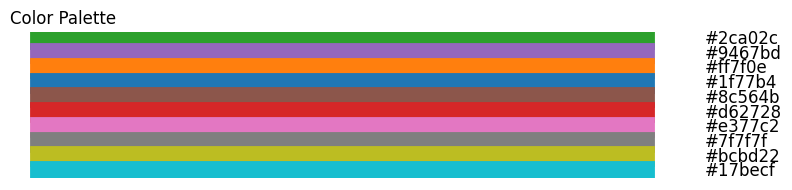

In [592]:
#visualize our palette 
# Define the palette
topCats = ["business", "sports", "news", "society", "health", "religion", "education"]
palette = ["#2ca02c","#9467bd","#ff7f0e","#1f77b4","#8c564b", "#d62728", 
            "#e377c2", "#7f7f7f", "#bcbd22", "#17becf"]

# Create a figure with color swatches
plt.figure(figsize=(8, 2))
for i, color in enumerate(palette):
    plt.plot([0, 1], [i, i], color=color, linewidth=15)
    plt.text(1.1, i, color, fontsize=12, va='center')

# Adjust the plot
plt.gca().invert_yaxis()
plt.axis('off')
plt.title("Color Palette", loc='left')
plt.tight_layout()
plt.show()

In [603]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/yifanHu_Dist50.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/yifanHu_Dist50" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH, withComponents=True)

before merging shape: (28982, 5)
after merging shape: (28982, 12)


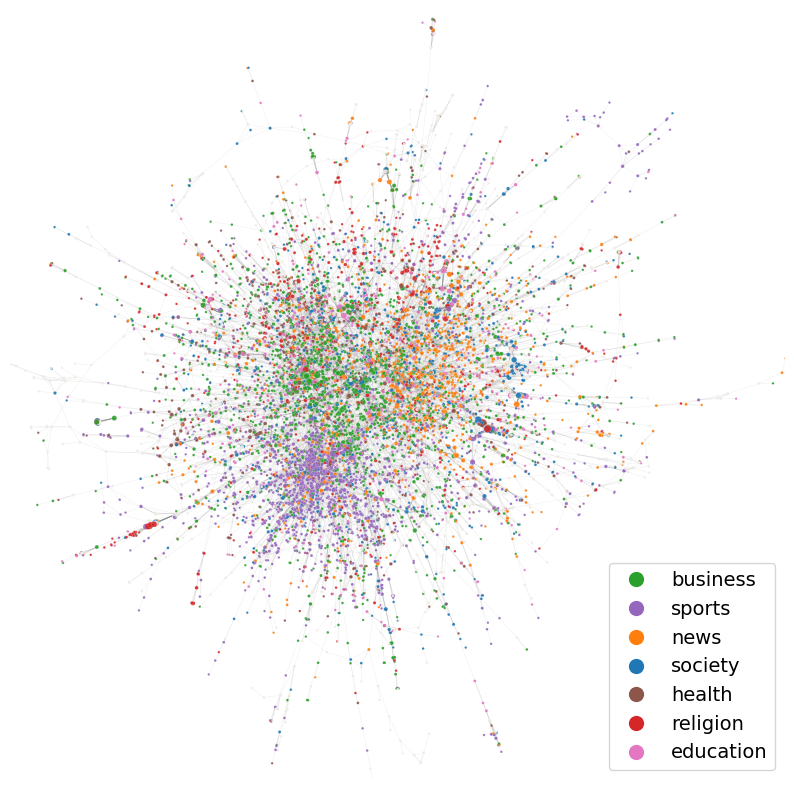

In [610]:
fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 30
newMin = 3
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.3, alpha=.15, colors=["grey" for cat in edgeCats], zorder=1, rasterized=True)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.1, rasterized=True)


ax.set_xlim([-4900,6100])
ax.set_ylim([-6200, 6000])
plt.axis("off")


# Create custom legend elements with points (markers) instead of lines
labels = ["business", "sports", "news", "society", "health", "religion", "education"]
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=12) for color in topCatsPalette[:len(topCats)]]
# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right', fontsize=14)

#ax.set_title("Yifan Hu, Distance 50")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight", dpi=800) 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800)

before merging shape: (36660, 5)
after merging shape: (36660, 12)


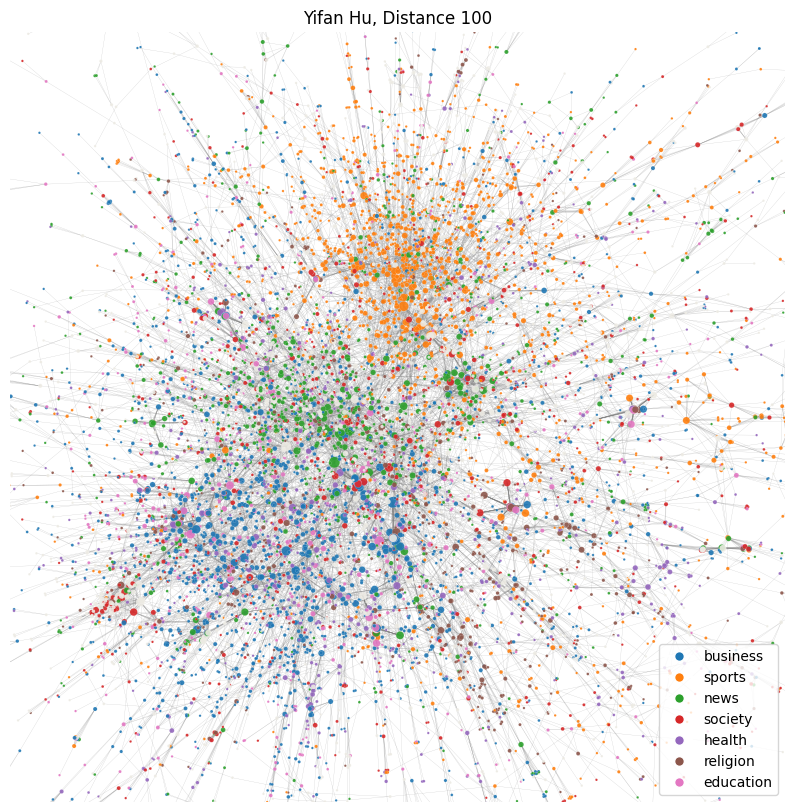

In [507]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/yifanHu_Dist100.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/yifanHu_Dist100Figure" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH)

fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 60
newMin = 3
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.1)

ax.set_xlim([-6000,6000])
ax.set_ylim([-6000,6500]) 
plt.axis("off")

# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title("Yifan Hu, Distance 100")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800) 

In [502]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/yifanHu_Dist200.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/yifanHu_Dist200Figure" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH)

before merging shape: (36660, 5)
after merging shape: (36660, 12)


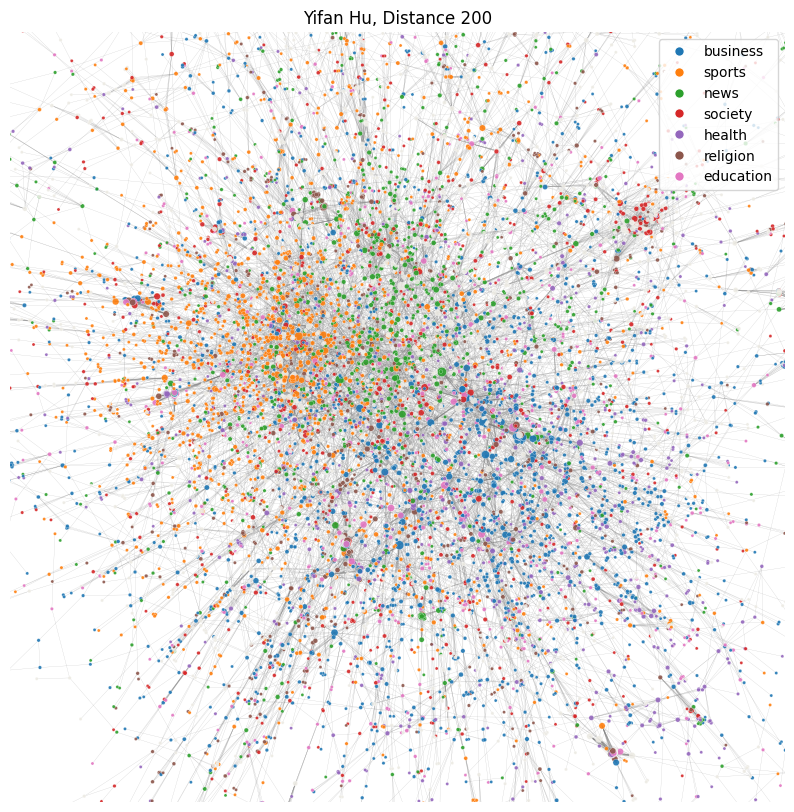

In [506]:

fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 40
newMin = 5 
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.2)

ax.set_xlim([-11000,11000])
ax.set_ylim([-12000,8000]) 
plt.axis("off")

# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='upper right')

ax.set_title("Yifan Hu, Distance 200")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800) 

In [494]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/yifanHu_Dist300.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/yifanHu_Dist300Figure" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH)

before merging shape: (36660, 5)
after merging shape: (36660, 12)


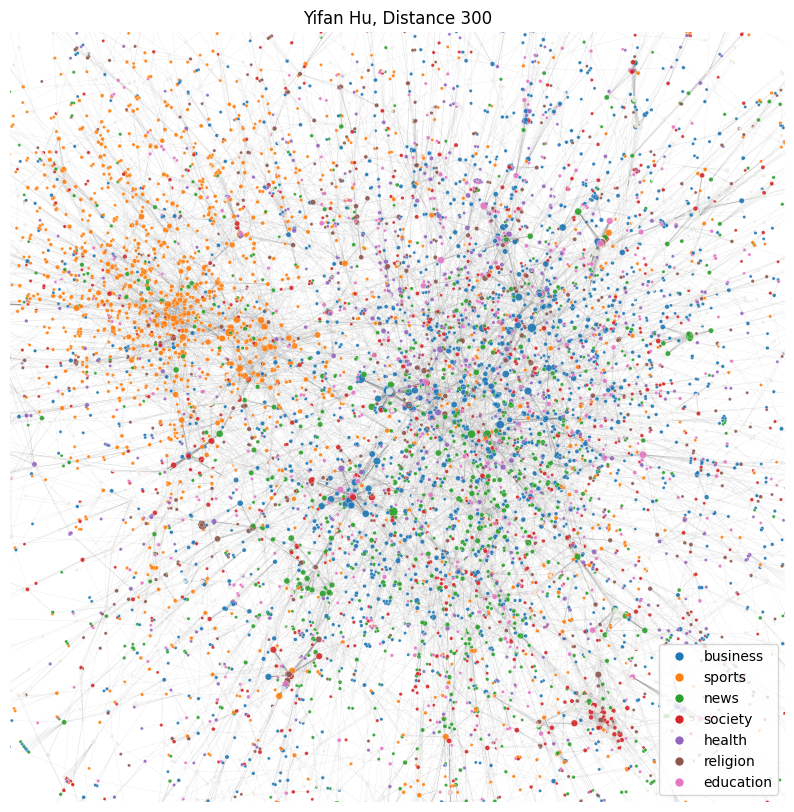

In [501]:
fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 40
newMin = 5
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.3, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.2)

ax.set_xlim([-13500,13000])
ax.set_ylim([-13000,13000]) 
plt.axis("off")

# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title("Yifan Hu, Distance 300")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800) 

In [550]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/forceAtlas2_scaling1.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/forceAtlas2_scaling1" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH)

before merging shape: (36660, 5)
after merging shape: (36660, 12)


In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 50
newMin = 5
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.2)


ax.set_xlim([-4000,4000])
ax.set_ylim([-4000,4000])
plt.axis("off")

# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title("Force Atlas 2, Scaling 1")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800)

In [435]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/forceAtlas2_scaling2.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/forceAtlas2_scaling2" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH)

before merging shape: (36660, 5)
after merging shape: (36660, 12)


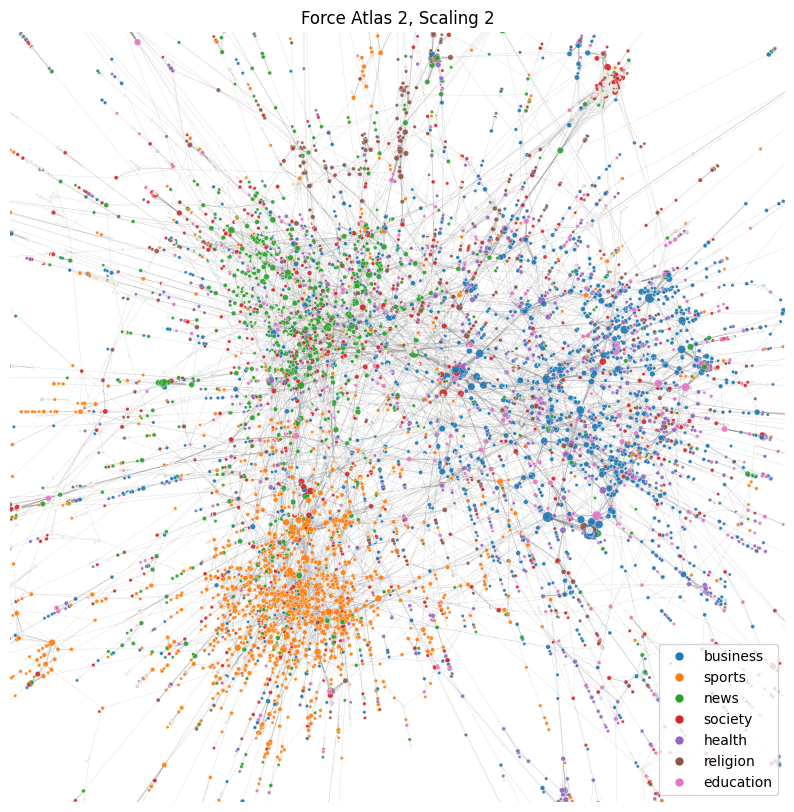

In [436]:
fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 50
newMin = 5
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.2)


ax.set_xlim([-4000,4000])
ax.set_ylim([-4000,4000])
plt.axis("off")

# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title("Force Atlas 2, Scaling 2")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800)

In [441]:

LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/forceAtlas2_scaling3.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/forceAtlas3_scaling3" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH)

before merging shape: (36660, 5)
after merging shape: (36660, 12)


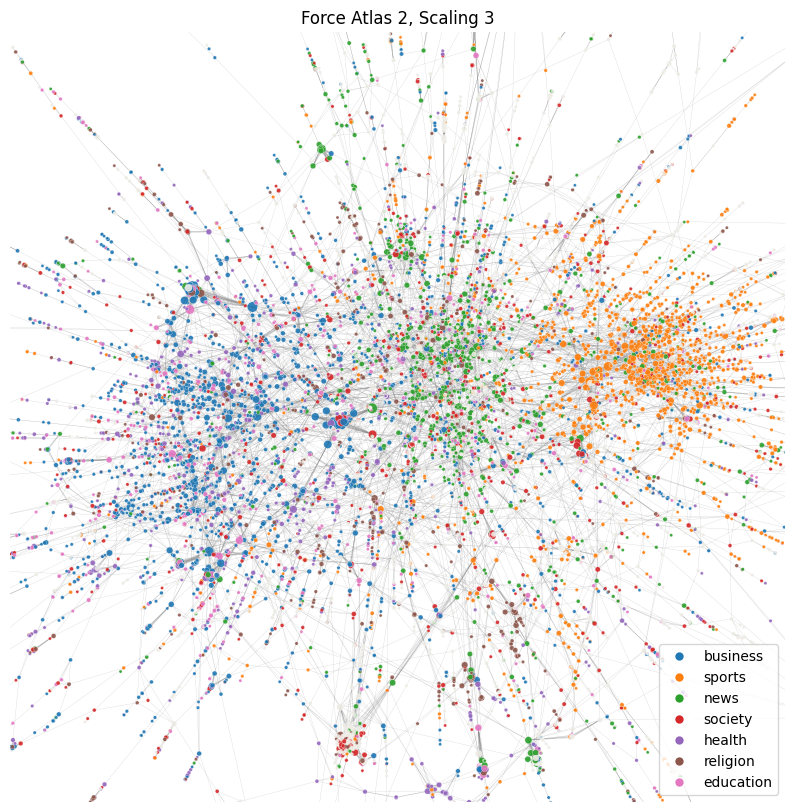

In [442]:
fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 50
newMin = 5
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.2)


ax.set_xlim([-5000,5000])
ax.set_ylim([-5000,5000])
plt.axis("off")


# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title("Force Atlas 2, Scaling 3")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800)

In [510]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/openOrd_20liquid35exp5crunch.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/openOrd_20liquid35exp5crunch" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH, withComponents=True)

before merging shape: (26589, 5)
after merging shape: (26589, 12)


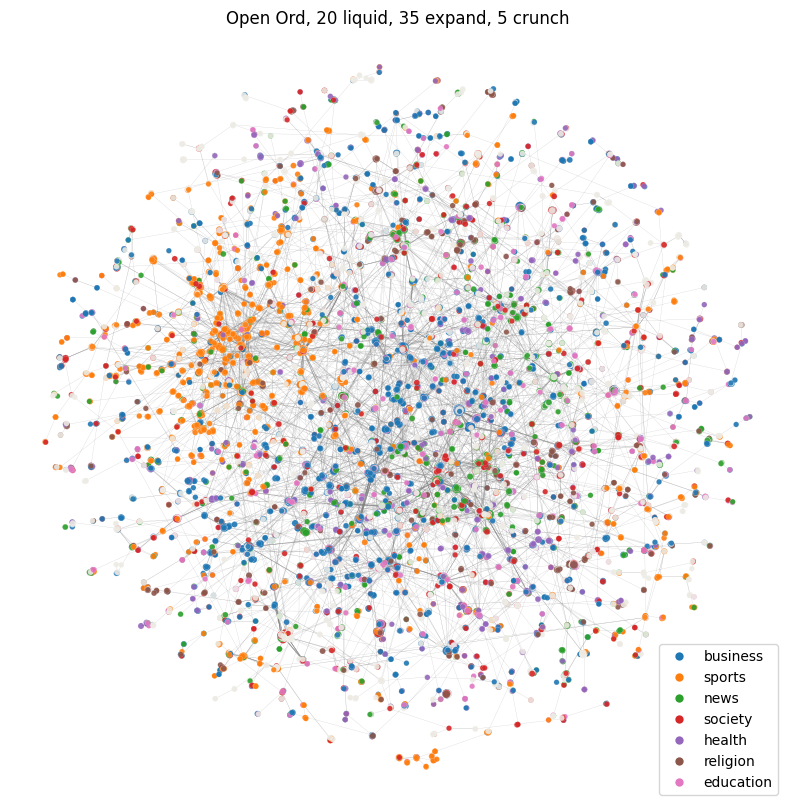

In [511]:

fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 50
newMin = 15
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.1)


#ax.set_xlim([-2000,2000])
#ax.set_ylim([-2500,2500])
plt.axis("off")


# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title("Open Ord, 20 liquid, 35 expand, 5 crunch")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800)

In [490]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/openOrd_20liquid35exp5crunch_.4EdgeCut.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/openOrd_20liquid35exp5crunch_.4Cut" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH, withComponents=True)

before merging shape: (26589, 5)
after merging shape: (26589, 12)


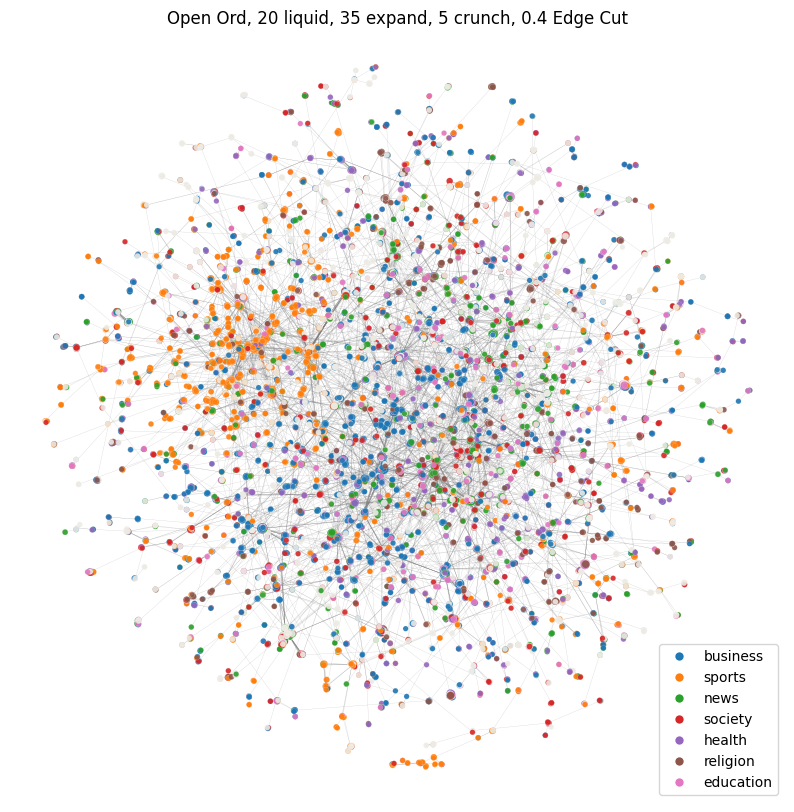

In [491]:
fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 50
newMin = 15
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.1)


#ax.set_xlim([-2000,2000])
#ax.set_ylim([-2500,2500])
plt.axis("off")


# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title(f"Open Ord, 20 liquid, 35 expand, 5 crunch, {.4} Edge Cut")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight")
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800)

In [508]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/openOrd_30exp5crunch.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/openOrd_30exp5crunch" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats, sizes, topCats = formatData(LAYOUT_PATH, withComponents=True)

before merging shape: (26589, 5)
after merging shape: (26589, 12)


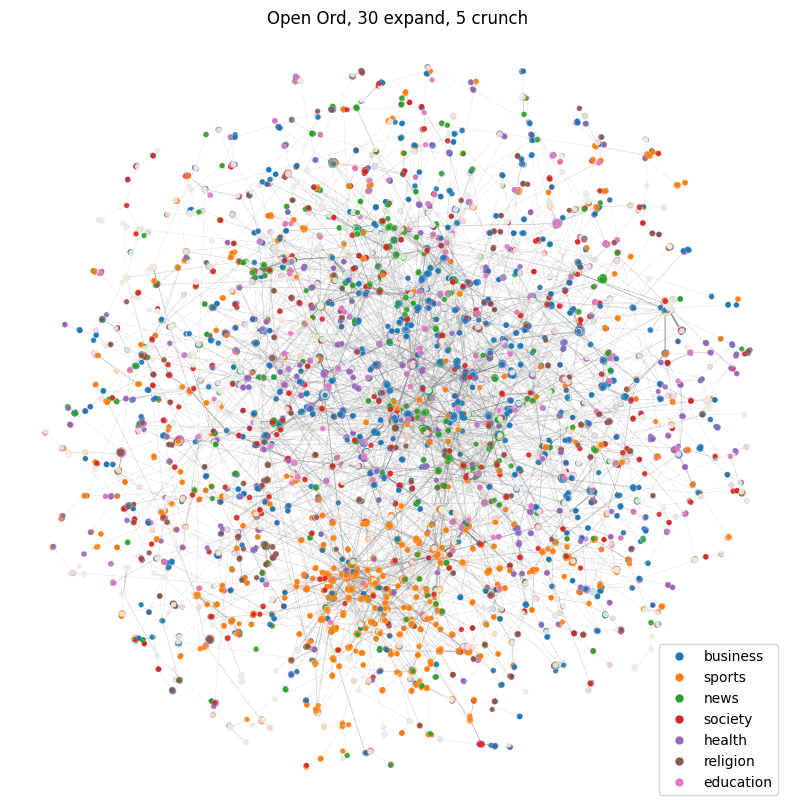

In [509]:
fig, ax = plt.subplots(figsize=(10, 10))

#do some size rescaling 
minSize = min(sizes)
maxSize = max(sizes)
newRange = 50
newMin = 15
scaledSizes = [newRange*((size - minSize)/(maxSize-minSize)) + newMin for size in sizes]

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.15, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

# Use Seaborn's default color palette in hexadecimal format
#palette = sns.color_palette("deep", n_colors=len(uniqueCats))
#hex_colors = palette.as_hex()  # Convert the palette to hex colors
#cat_to_color = {cat: hex_colors[i] for i, cat in enumerate(uniqueCats)}

colorMapping = dict(zip(uniqueCats, topCatsPalette))

# Map the categories in 'category1' to their corresponding colors
node_colors = nodeDf['category1'].map(colorMapping)

#sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=[.001 for item in sizes], hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)
scatter = ax.scatter(nodeDf['x'], nodeDf['y'], s=scaledSizes, c=node_colors, alpha=0.9, zorder=2, edgecolors="white", linewidths=.1)


#ax.set_xlim([-2000,2000])
#ax.set_ylim([-2500,2500])
plt.axis("off")


# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in topCatsPalette[:len(topCats)]]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title(f"Open Ord, 30 expand, 5 crunch")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight")
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800)

before merging shape: (36660, 5)
after merging shape: (36660, 12)


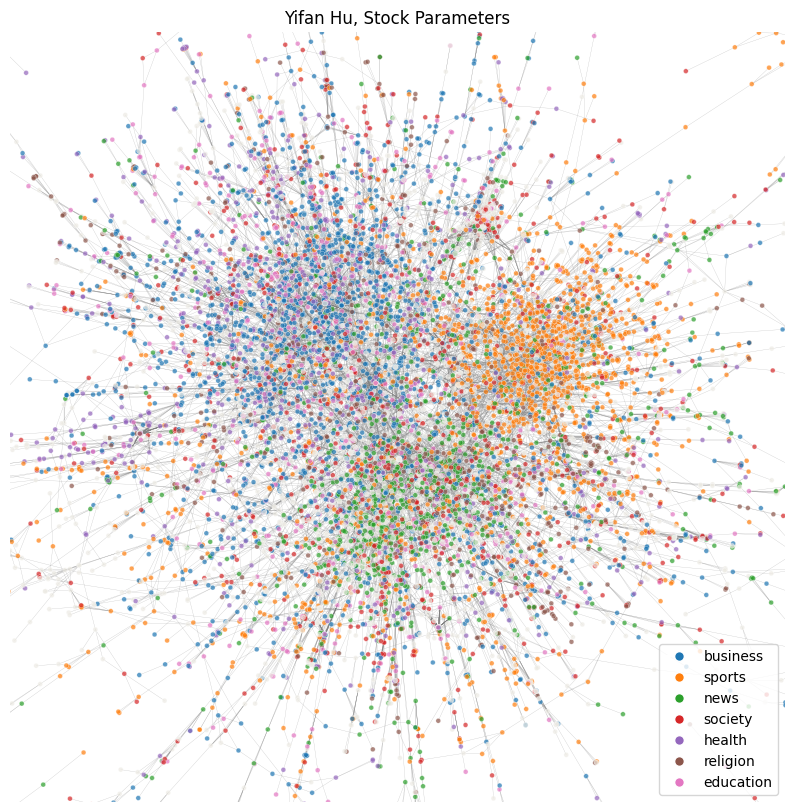

In [330]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/yifanHuLayout.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/yifanHuFigure" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats = formatData(LAYOUT_PATH)

fig, ax = plt.subplots(figsize=(10, 10))

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])
lc = LineCollection(edgeTups, linewidths=.2, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)

sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=12, hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)


#ax.set_xlim([-6000,7000])
#ax.set_ylim([-6000,6500]) 
ax.set_xlim([-15000, 15000])
ax.set_ylim([-15000, 15000])
plt.axis("off")

from matplotlib.lines import Line2D
# Define the colors and labels
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
labels = ["business", "sports", "news", "society", "health", "religion", "education"]

# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in colors]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')

ax.set_title("Yifan Hu, Stock Parameters")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800) 


before merging shape: (36660, 5)
after merging shape: (36660, 12)


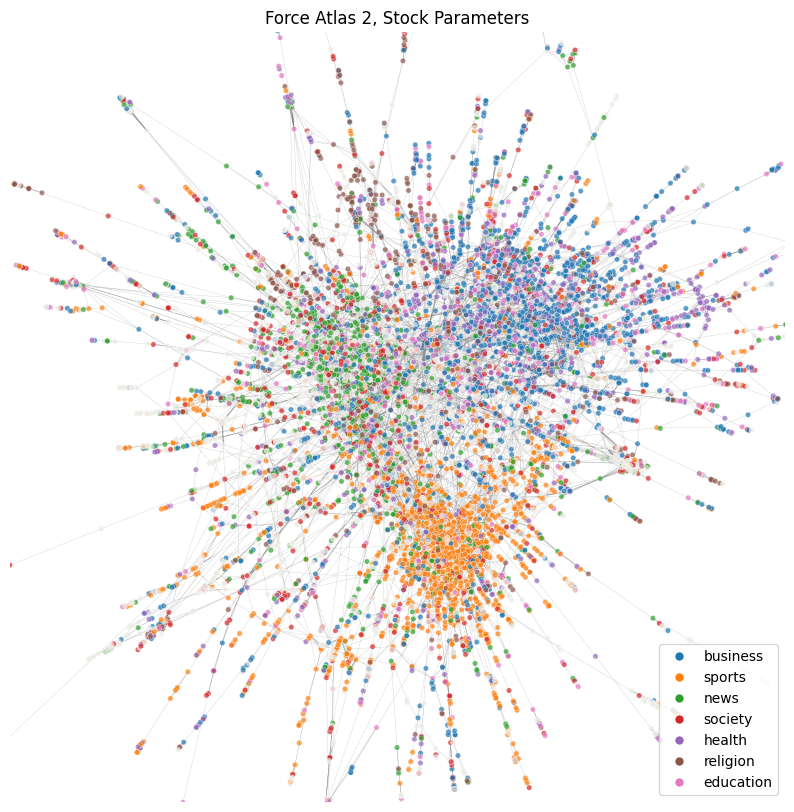

In [332]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/forceAtlasLayout.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/forceAtlasFigure" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats = formatData(LAYOUT_PATH)

fig, ax = plt.subplots(figsize=(10, 10))

lc = LineCollection(edgeTups, linewidths=.2, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)
sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=15, hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])

#ax.set_xlim([-6000,7000])
#ax.set_ylim([-6000,6500]) 
ax.set_xlim([-6000, 6000])
ax.set_ylim([-6000, 6000])
plt.axis("off")

from matplotlib.lines import Line2D
# Define the colors and labels
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
labels = ["business", "sports", "news", "society", "health", "religion", "education"]

# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in colors]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')


ax.set_title("Force Atlas 2, Stock Parameters")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800) 


In [ ]:
LAYOUT_PATH="/shared/3/projects/benlitterer/podcastData/hostGuestNetwork/forceAtlasLayout.json"
OUT_STEM="/shared/3/projects/benlitterer/podcastData/figures/hostGuestNetwork/forceAtlasFigure" 
nodeDf, edgeTups, uniqueCats, topCatsPalette, edgeCats = formatData(LAYOUT_PATH)

fig, ax = plt.subplots(figsize=(10, 10))

lc = LineCollection(edgeTups, linewidths=.2, alpha=.5, colors=["grey" for cat in edgeCats], zorder=1)
ax.add_collection(lc)
sns.scatterplot(nodeDf, x="x", y="y", alpha=.7, s=15, hue="category1", hue_order=uniqueCats, palette=topCatsPalette, zorder=2)

#lc = LineCollection(edgeTups, linewidths=.3, alpha=.4, colors=[catMapping[cat] for cat in edgeCats])

#ax.set_xlim([-6000,7000])
#ax.set_ylim([-6000,6500]) 
ax.set_xlim([-6000, 6000])
ax.set_ylim([-6000, 6000])
plt.axis("off")

from matplotlib.lines import Line2D
# Define the colors and labels
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
labels = ["business", "sports", "news", "society", "health", "religion", "education"]

# Create custom legend elements with points (markers) instead of lines
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=7) for color in colors]

# Add the custom legend to the plot
ax.legend(legend_elements, labels, loc='lower right')


ax.set_title("Force Atlas 2, Stock Parameters")
plt.savefig(f"{OUT_STEM}.pdf", bbox_inches="tight") 
plt.savefig(f"{OUT_STEM}.png", bbox_inches="tight", dpi=800) 


/tmp/ipykernel_1379872/1538670624.py:3: UserWarning: The palette list has more values (27) than needed (6), which may not be intended.
  sns.scatterplot(nodeDf, x="x", y="y", alpha=.5, s=15, hue="category1", hue_order=topCats, palette=topCatsPalette, style="gfMention", markers=["o", "^"])


Text(0.5, 1.0, 'Guest Network: Color by Category, Shape by Mention of George Floyd')

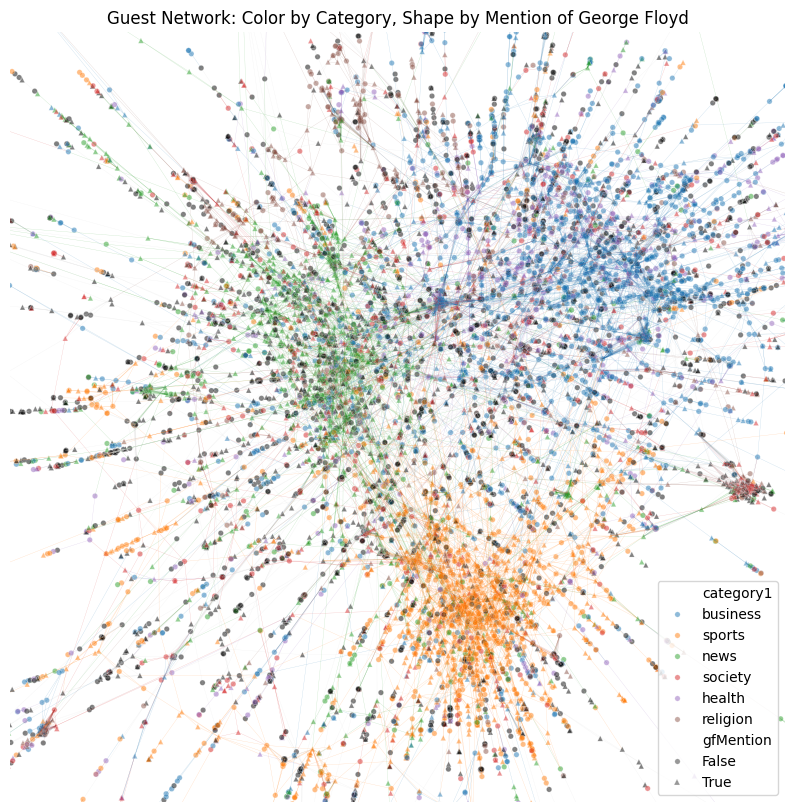

In [237]:
fig, ax = plt.subplots(figsize=(10, 10))

sns.scatterplot(nodeDf, x="x", y="y", alpha=.5, s=15, hue="category1", hue_order=topCats, palette=topCatsPalette, style="gfMention", markers=["o", "^"])

lc = LineCollection(edgeTups, linewidths=.2,alpha=.3, colors=[catMapping[cat] for cat in edgeCats])
ax.add_collection(lc)

ax.set_xlim([-4000,4000])
ax.set_ylim([-4000,4000]) 
plt.axis("off")

ax.set_title("Guest Network: Color by Category, Shape by Mention of George Floyd")

In [238]:
nodeDf["gfMention"]

0        False
1        False
2         True
3         True
4         True
         ...  
23466    False
23467    False
23468     True
23469     True
23470    False
Name: gfMention, Length: 23471, dtype: object

In [245]:
len(topCats)

6

Text(0.5, 1.0, 'Guest Network: Color by Category, Border by Mention of George Floyd')

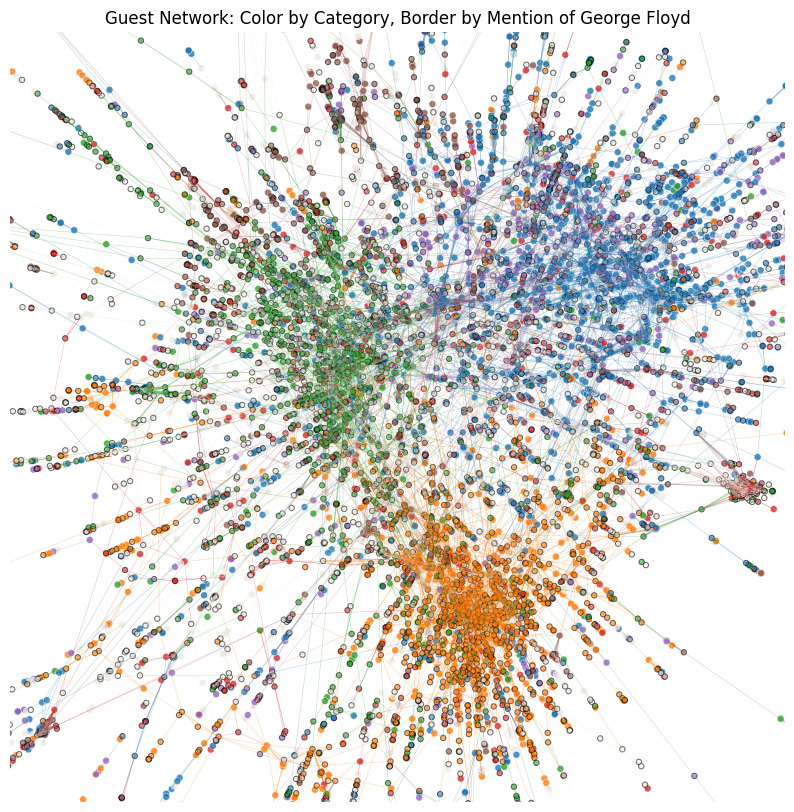

In [249]:
fig, ax = plt.subplots(figsize=(10, 10))

#sns.scatterplot(nodeDf, x="x", y="y", alpha=1, s=15, hue="category1", hue_order=topCats, palette=topCatsPalette, markers="o")
sns.scatterplot(nodeDf[nodeDf["gfMention"] == "False"], x="x", y="y", alpha=.8, s=25, markers="o", hue="category1", hue_order=uniqueCats, palette=topCatsPalette)
sns.scatterplot(nodeDf[nodeDf["gfMention"] == "True"], x="x", y="y", alpha=.6, s=15, markers="o", hue="category1", hue_order=uniqueCats, palette=topCatsPalette, edgecolors="black", linewidth=.7)

lc = LineCollection(edgeTups, linewidths=.35,alpha=.35, colors=[catMapping[cat] for cat in edgeCats])
ax.add_collection(lc)

ax.set_xlim([-4000,4000])
ax.set_ylim([-4000,4000]) 
plt.axis("off")
ax.get_legend().remove()

ax.set_title("Guest Network: Color by Category, Border by Mention of George Floyd")

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))

sns.scatterplot(nodeDf, x="x", y="y", alpha=.5, s=15, hue="category1", hue_order=topCats, palette=topCatsPalette, style="gfMention", markers=["o", "^"])

lc = LineCollection(edgeTups, linewidths=.2,alpha=.3, colors=[catMapping[cat] for cat in edgeCats])
ax.add_collection(lc)

ax.set_xlim([-4000,4000])
ax.set_ylim([-4000,4000]) 
plt.axis("off")

ax.set_title("Guest Network: Color by Category, Shape by Mention of George Floyd")

/tmp/ipykernel_1379872/2233639102.py:3: UserWarning: The palette list has more values (27) than needed (6), which may not be intended.
  sns.scatterplot(nodeDf, x="x", y="y", alpha=1, s=15, hue="category1", hue_order=topCats, palette=topCatsPalette, style="gfMention", markers=["o", "$\circ$"])


Text(0.5, 1.0, 'Guest Network: Color by Category, Shape by Mention of George Floyd')

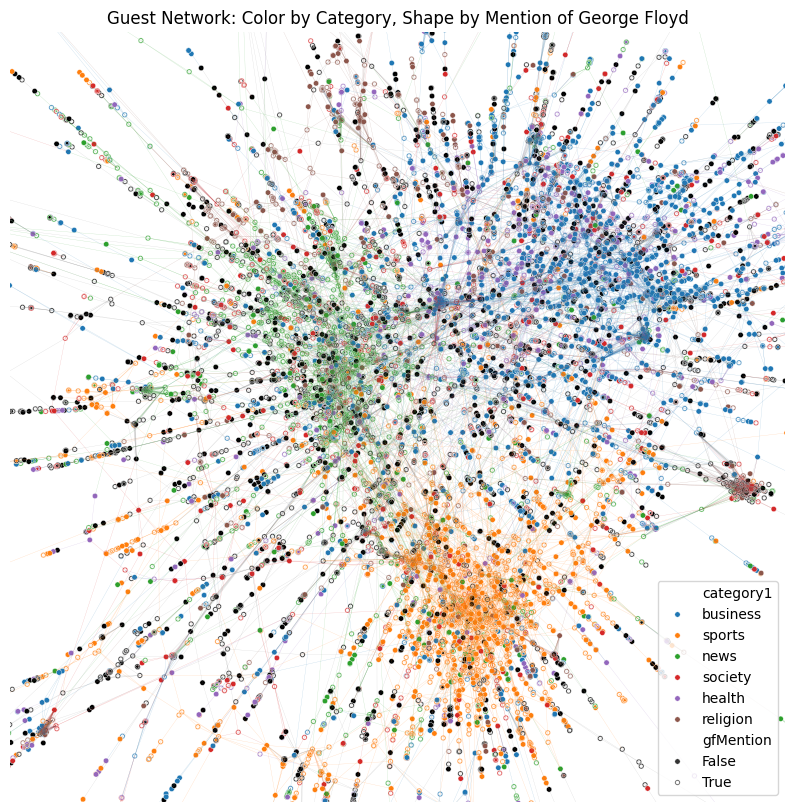

In [209]:
fig, ax = plt.subplots(figsize=(10, 10))

sns.scatterplot(nodeDf, x="x", y="y", alpha=1, s=15, hue="category1", hue_order=topCats, palette=topCatsPalette, style="gfMention", markers=["o", "$\circ$"])

lc = LineCollection(edgeTups, linewidths=.2,alpha=.3, colors=[catMapping[cat] for cat in edgeCats])
ax.add_collection(lc)

ax.set_xlim([-4000,4000])
ax.set_ylim([-4000,4000]) 
plt.axis("off")

ax.set_title("Guest Network: Color by Category, Shape by Mention of George Floyd")

Text(0.5, 1.0, 'Guest Network: Color by Category, Shape by Mention of George Floyd')

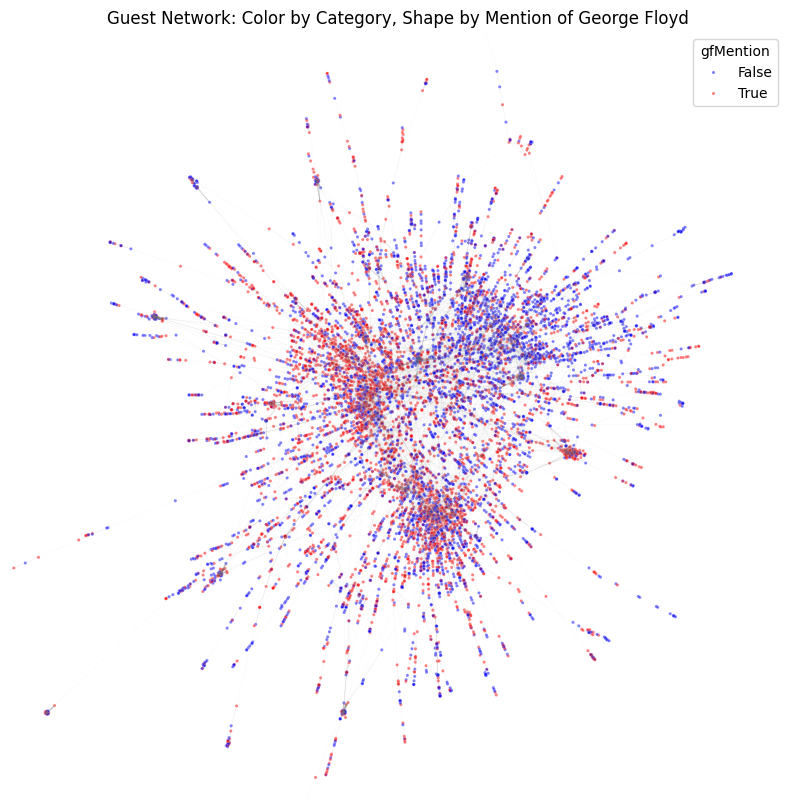

In [253]:
fig, ax = plt.subplots(figsize=(10, 10))

sns.scatterplot(nodeDf, x="x", y="y", alpha=.5, s=5, hue="gfMention", palette=["blue", "red"])

lc = LineCollection(edgeTups, linewidths=.1,alpha=.2, colors="grey")
ax.add_collection(lc)

ax.set_xlim([-8000,8000])
ax.set_ylim([-8000,8000]) 
plt.axis("off")

#fig.suptitle("Guest Network: Color by Category, Shape by Mention of George Floyd")
ax.set_title("Guest Network: Color by Category, Shape by Mention of George Floyd")